In [1]:
#importamos librerias utiles
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#para hacer grafos 3D
from mpl_toolkits.mplot3d import Axes3D
#para hacer PCA
from sklearn import decomposition
from sklearn.decomposition import PCA
#maquina de soporte vectorial
from sklearn.svm import SVC
#metricas
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.svm import LinearSVC
import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [2]:
#funcionpara observar un grafico 3D de puntos (x,y,z)
#x,y,z son las posiciones de los puntos a observar
def grafico3D(x,y,z,X,Y):  
    #para hacer un grafico interactivo
    %matplotlib notebook
    fig = plt.figure()
    ax = fig.add_subplot(1,1,1, projection='3d')
    #definimos un conjunto de colores que representara cada una de las 15 clases
    colores=['goldenrod', 'lightblue', 'coral','blue','red','green', 'pink', 'purple','cyan','magenta','yellow','black','olive', 'tan','gold']
    #graficamos los puntos de acuerdo al conjunto de datos X y su clase Y
    for i,c in enumerate(colores):
      plt.plot(X[Y==i,x], X[Y==i,y], X[Y==i,z], 'o', color=c)

In [3]:
#funcionpara observar un grafico 2D de puntos (x,y)
#x,y son las posiciones de las columnas de los puntos a observar
def grafico2D(X,Y):
    #definimos un conjunto de colores que representara cada una de las 15 clases
    colores=['goldenrod', 'lightblue', 'coral','blue','red','green', 'pink', 'purple','cyan','magenta','yellow','black','olive', 'tan','gold']
    fig = plt.figure(1, figsize=(8, 6))
    #graficamos los puntos de acuerdo al conjunto de datos X y su clase Y
    for i,c in enumerate(colores):
        plt.plot(X[np.where(Y==i), 0],X[np.where(Y==i), 1],'o', color=c)
    plt.show()

## Lectura de datos

In [4]:
#cargamos los datos de entrenamiento
data = pd.read_csv('texturaTrain10y10.csv')
#mostramos el dataframe
data

,contraste,disimilitud,homogeneidad,asm,energia,correlacion,h1,h2,h3,h4,h5,h6,h7,area,clase
0,4.177245,1.747840,1.680545,7.362870,3.681435,0.926795,-6.872705,-15.126124,-25.190195,-27.220761,-53.426261,-34.790696,-58.460341,0.419115,0.0
1,4.108401,1.729438,1.668160,7.160279,3.580140,0.900448,-6.872705,-15.126124,-25.190195,-27.220761,-53.426261,-34.790696,-58.460341,0.419115,0.0
2,4.117330,1.733648,1.670453,7.271198,3.635599,0.923007,-6.872705,-15.126124,-25.190195,-27.220761,-53.426261,-34.790696,-58.460341,0.419115,0.0
3,4.038172,1.690636,1.647523,7.355514,3.677757,0.934015,-6.872705,-15.126124,-25.190195,-27.220761,-53.426261,-34.790696,-58.460341,0.419115,0.0
4,4.169295,1.737881,1.673359,6.678973,3.339487,0.800519,-6.872705,-15.126124,-25.190195,-27.220761,-53.426261,-34.790696,-58.460341,0.419115,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8795,4.596457,1.973249,1.917195,7.430269,3.715135,0.851139,-7.055902,-16.262917,-28.230651,-31.479836,-61.417627,-39.944392,-62.276402,0.409784,14.0
8796,4.797532,2.029876,1.906705,7.163416,3.581708,0.819378,-7.055902,-16.262917,-28.230651,-31.479836,-61.417627,-39.944392,-62.276402,0.409784,14.0
8797,4.700788,2.008441,1.925291,7.708236,3.854118,0.900252,-7.055902,-16.262917,-28.230651,-31.479836,-61.417627,-39.944392,-62.276402,0.409784,14.0
8798,4.593327,1.975883,1.910288,6.985119,3.492560,0.753476,-7.055902,-16.262917,-28.230651,-31.479836,-61.417627,-39.944392,-62.276402,0.409784,14.0


In [5]:
#dividimos entre variables independientes y variables dependientes
X = data.loc[:,:'area'].to_numpy()
Y = data['clase'].to_numpy()

In [6]:
#cargamos los datos de test
test = pd.read_csv('texturaTest10y10.csv')
#mostramos el dataframe
test

,contraste,disimilitud,homogeneidad,asm,energia,correlacion,h1,h2,h3,h4,h5,h6,h7,area,clase
0,4.240117,1.788575,1.741920,7.037618,3.518809,0.904044,-6.896990,-15.173389,-25.174142,-27.159148,-53.325917,-34.757813,-57.476338,0.415672,0.0
1,4.146349,1.748520,1.693571,7.082759,3.541379,0.894947,-6.896990,-15.173389,-25.174142,-27.159148,-53.325917,-34.757813,-57.476338,0.415672,0.0
2,4.199948,1.742074,1.653593,7.275633,3.637816,0.919466,-6.896990,-15.173389,-25.174142,-27.159148,-53.325917,-34.757813,-57.476338,0.415672,0.0
3,4.206023,1.761353,1.675267,7.428363,3.714182,0.932431,-6.896990,-15.173389,-25.174142,-27.159148,-53.325917,-34.757813,-57.476338,0.415672,0.0
4,4.043744,1.686956,1.626779,6.737980,3.368990,0.852967,-6.896990,-15.173389,-25.174142,-27.159148,-53.325917,-34.757813,-57.476338,0.415672,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2191,5.221273,2.309220,2.218626,7.739742,3.869871,0.773406,-7.077666,-15.964014,-27.488094,-30.081130,-60.060930,-38.478394,-58.913775,0.381961,14.0
2192,4.678658,2.034041,1.989003,7.241548,3.620774,0.783952,-7.077666,-15.964014,-27.488094,-30.081130,-60.060930,-38.478394,-58.913775,0.381961,14.0
2193,5.145990,2.297888,2.239543,7.787964,3.893982,0.773879,-7.077666,-15.964014,-27.488094,-30.081130,-60.060930,-38.478394,-58.913775,0.381961,14.0
2194,5.021512,2.187627,2.103624,7.494540,3.747270,0.805230,-7.077666,-15.964014,-27.488094,-30.081130,-60.060930,-38.478394,-58.913775,0.381961,14.0


In [7]:
#dividimos entre variables independientes y variables dependientes
Xtest = test.loc[:,:'area'].to_numpy()
Ytest = test['clase'].to_numpy()

## Analisis exploratorio de los datos

### PCA
Primero para visualizar hacemos PCA de 2D y 3D a los datos originales (solo train)

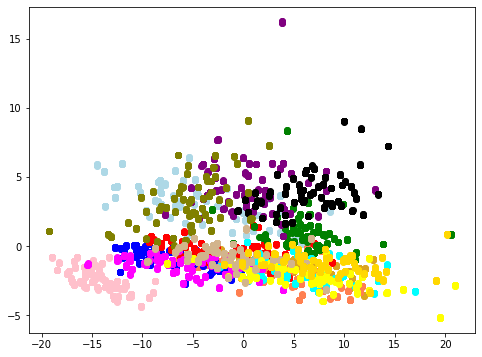

In [8]:
PCA2D = PCA(n_components=2)
PCA2D.fit(X)
proy =  PCA2D.transform(X)
grafico2D(proy,Y)

## A ojo se ve que una SVM en esos datos 2D no va a tener buenos hiperplanos separadores

<IPython.core.display.Javascript object>


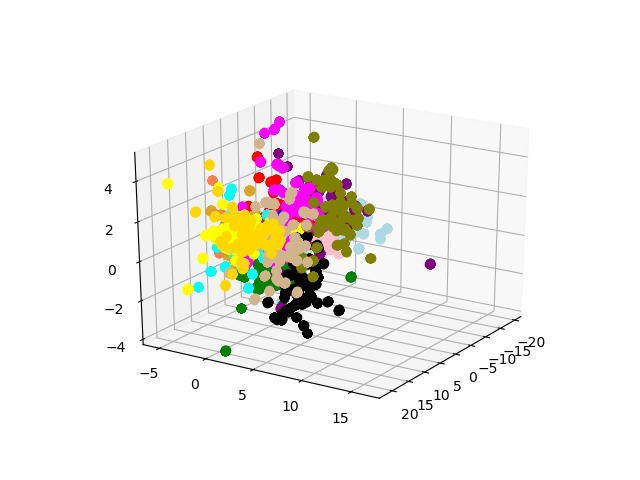

In [9]:
PCA3D = PCA(n_components=3)
PCA3D.fit(X)
proy =  PCA3D.transform(X)
grafico3D(0,1,2,proy,Y)

## de nuevo las clases estan mejor separadas con respecto al 2D pero parece que hay unas clases que se superponen

## grafiquemos ahora los componentes en 3D dejando a las otras propiedades fuera

<IPython.core.display.Javascript object>


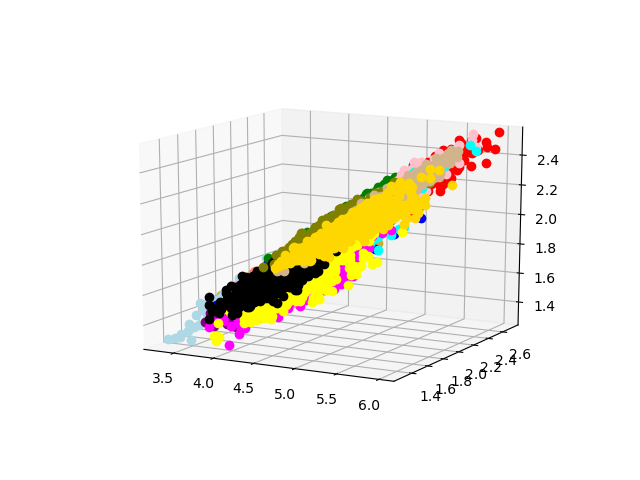

In [14]:
#contraste disimilitud y homogeneidad
grafico3D(0,1,2,X,Y)

<IPython.core.display.Javascript object>


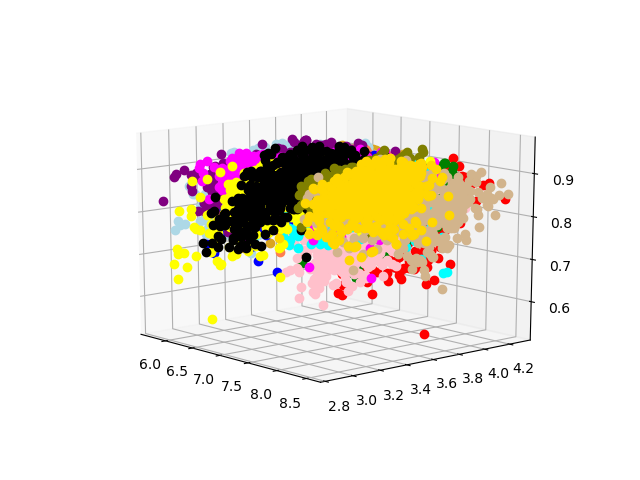

In [15]:
#asm, energia y correlacion
grafico3D(3,4,5,X,Y)

<IPython.core.display.Javascript object>


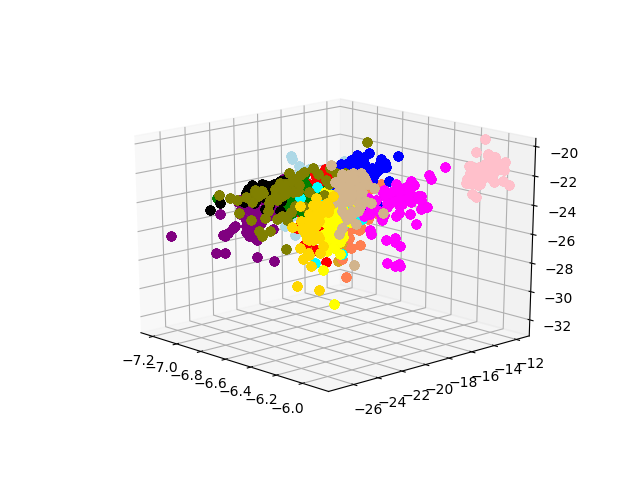

In [16]:
#h1, h2 y h3
grafico3D(6,7,8,X,Y)

<IPython.core.display.Javascript object>


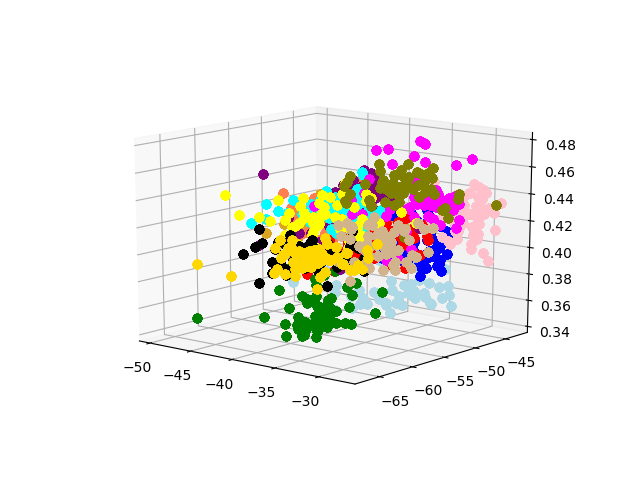

In [17]:
#h6, h7 y area
grafico3D(11,12,13,X,Y)

<IPython.core.display.Javascript object>


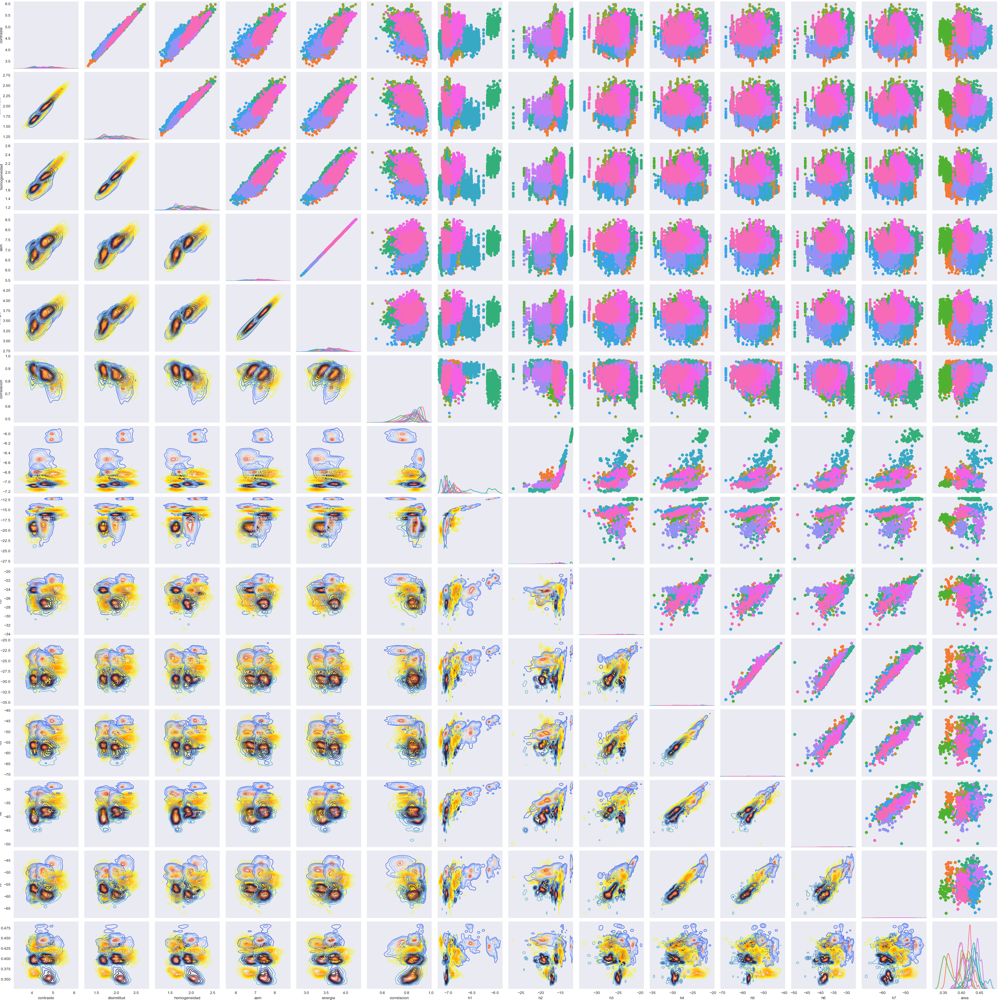

In [18]:
from itertools import cycle
sns.set_style('dark')
def make_kde(*args,**kwargs):
    sns.kdeplot(*args, cmap=next(make_kde.cmap_cycle), **kwargs)
make_kde.cmap_cycle = cycle(('coolwarm', 'Wistia', 'icefire'))
our_plot = sns.PairGrid(data, vars=('contraste', 'disimilitud','homogeneidad','asm','energia','correlacion','h1',
    'h2','h3','h4','h5','h6','h7','area'), hue='clase', dropna=True)
our_plot.map_diag(sns.kdeplot)
our_plot.map_lower(make_kde)
our_plot.map_upper(plt.scatter)
our_plot.savefig("output.png")

<IPython.core.display.Javascript object>


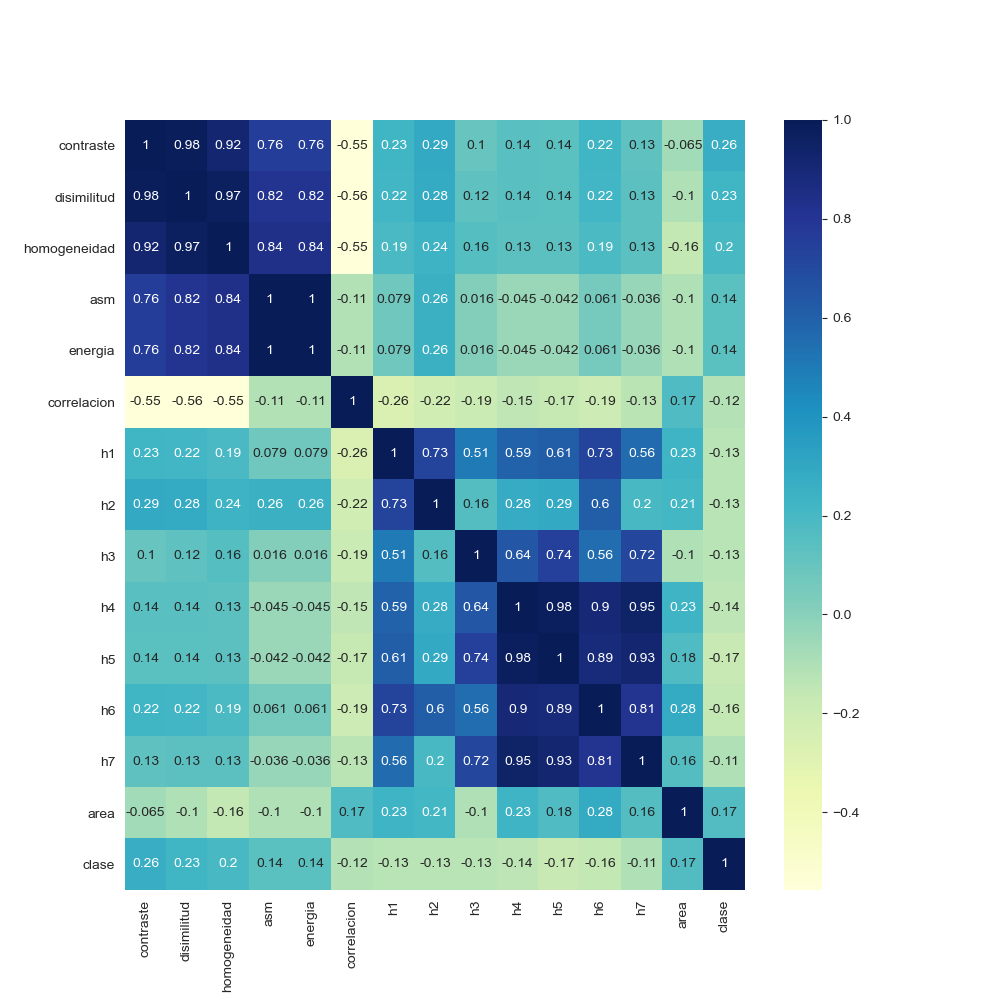

In [19]:
#obtenemos la correlacion de todos los datos
cor = data.corr()
#creamos una figura que muestre el heatmap de las correlaciones
fig = plt.subplots(figsize=(10,10)) 
sns.heatmap(cor, annot=True, cmap=plt.cm.YlGnBu)
plt.show()

In [20]:
#describimos los datos que hay en el dataframe de train
#este describe nos npuede dar informacion util al momento de
#seleccionar caracteristicas
data.describe()

,contraste,disimilitud,homogeneidad,asm,energia,correlacion,h1,h2,h3,h4,h5,h6,h7,area,clase
count,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000,8800.000000
mean,4.534496,1.923093,1.843302,7.143608,3.571804,0.850716,-6.868530,-16.170850,-25.158569,-27.030667,-53.526257,-35.570222,-54.392727,0.414186,7.013295
std,0.416175,0.232195,0.229161,0.441862,0.220931,0.059739,0.266993,2.251733,1.826026,2.533164,4.637469,3.356467,4.167137,0.026532,4.322012
min,3.315343,1.287111,1.267615,5.737527,2.868763,0.517956,-7.206419,-26.923987,-32.869047,-34.634479,-68.163647,-49.709590,-66.876845,0.338407,0.000000
25%,4.202024,1.735155,1.660870,6.827897,3.413949,0.817484,-7.037257,-17.345418,-26.324046,-29.020210,-56.875639,-37.858449,-57.371053,0.398653,3.000000
50%,4.492889,1.894548,1.798615,7.174684,3.587342,0.860634,-6.937099,-15.509631,-25.091313,-27.222675,-53.907535,-35.783663,-54.712402,0.417223,7.000000
75%,4.838457,2.095574,2.025062,7.457336,3.728668,0.893679,-6.825886,-14.876539,-24.020618,-25.054423,-50.302717,-33.468632,-51.204467,0.433992,11.000000
max,5.980542,2.715433,2.559384,8.530866,4.265433,0.974435,-5.901077,-11.907526,-19.733209,-20.737220,-41.534409,-27.572291,-43.022904,0.482159,14.000000


In [21]:
#describimos los datos que hay en el dataframe test
test.describe()

,contraste,disimilitud,homogeneidad,asm,energia,correlacion,h1,h2,h3,h4,h5,h6,h7,area,clase
count,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000,2196.000000
mean,4.549408,1.931591,1.850624,7.149135,3.574567,0.849325,-6.881928,-16.278408,-25.126559,-27.135124,-53.634146,-35.699632,-54.608791,0.414363,7.015483
std,0.415447,0.231706,0.228894,0.452603,0.226301,0.060160,0.257379,2.294388,1.901499,2.643132,4.847046,3.245147,4.302641,0.026510,4.325665
min,3.339195,1.299474,1.348048,5.719420,2.859710,0.611759,-7.209308,-24.456948,-34.397495,-35.094196,-64.996073,-46.100036,-65.900428,0.346390,0.000000
25%,4.227628,1.745248,1.670277,6.816126,3.408063,0.817890,-7.043233,-17.397829,-26.061352,-29.125288,-56.483093,-37.952512,-57.429861,0.401688,3.000000
50%,4.510692,1.906268,1.806921,7.189220,3.594610,0.858745,-6.946968,-15.630718,-25.067656,-27.253217,-53.864196,-35.617348,-54.798028,0.416458,7.000000
75%,4.848482,2.103340,2.032269,7.471835,3.735917,0.893626,-6.829697,-14.878247,-23.943341,-25.136355,-50.239745,-33.779830,-51.637980,0.433635,11.000000
max,5.823987,2.653232,2.600790,8.417708,4.208854,0.966807,-5.980669,-12.072341,-20.475023,-21.697064,-42.987555,-28.267096,-43.555865,0.492200,14.000000


## Entrenando SVM para el conjunto de datos

In [ ]:
#debido al tiempo que toma entrenar una svm lineal las siguientes lineas se comentan
#pero el resultado se muestra en la imagen de la siguiente celda
#Entrenamos una SVM con kernel lineal a partir de los datos de entrenamiento
#SVM = LinearSVC(multi_class='crammer_singer',max_iter=1000000000)
#SVM.fit(X,Y)
#prediccion = SVM.predict(Xtest)
#accuracy_score(Ytest,prediccion)

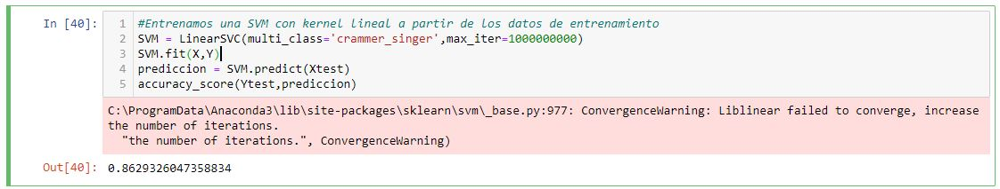

In [ ]:
#Entrenamos una SVM con kernel lineal a partir de los datos de entrenamiento
#debido al tiempo que toma entrenar una svm lineal las siguientes lineas se comentan
#pero el resultado se muestra en la imagen de la siguiente celda
#SVM1 = LinearSVC(max_iter=1000000000)
#SVM1.fit(X,Y)
#prediccion1 = SVM1.predict(Xtest)
#accuracy_score(Ytest,prediccion1)

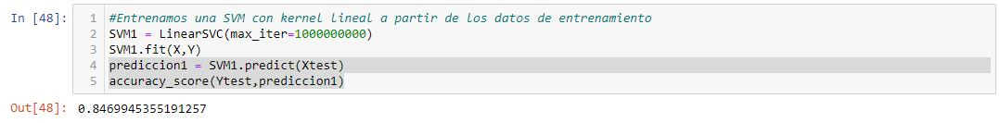

In [22]:
#entrenamos una SVM con kernel lineal. Misteriosamente
#el tiempo de ejecucion para svc de kernels es mucho menor comparada a la
#funcion LinearSVC de scikit, apesar de que la documentacion diga lo contrario
SVMLineal = SVC(kernel='linear')
SVMLineal.fit(X,Y)
#predecimos nuestros valores de Xtest
prediccion2 = SVMLineal.predict(Xtest)
#imprimimos el accuracy score
accuracy_score(Ytest,prediccion2)

0.8538251366120219

### Las siguientes imagenes corresponden al accuracy score del entrenamiento con diferentes kernels

Kernel radial basis function (rbf)
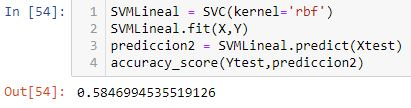

kernel sigmoide ('sigmoid')
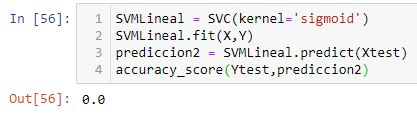

kernel polinomial de grado 3 ('poly')
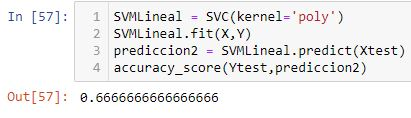

kernel polinomial de grado 5 ('poly')
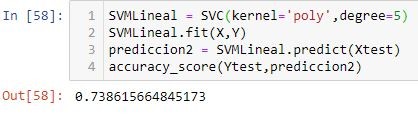

kernel polinomial de grado 8 ('poly')
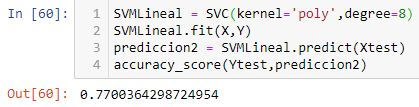

kernel polinomial de grado 19 ('poly')
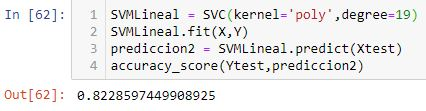

De aqui concluimos que aparentemente el mejor es el kernel lineal por lo que tranajaremos sobre el

In [23]:
#creamos una funcion para observar el comportamiento del accuracy en funcion del
#parametro de regularizacion. los parametros fin es hasta que valor de C queremos variar
#y paso el valor a sumar a C desde 1 a la siguiente iteracion
def accuracyVariandoC(X,Y,Xtest,Ytest,fin,paso):
    #creamos dos arrays auxiliares que contendran la informacion del accuracy y el valor de C actual
    accuracy = []
    regulariz = []
    #iteramos desde 1 hasta el valor de fin con paso paso
    for regularizacion in range(1,fin,paso):
        #instanciamos la SVM con kernel lineal
        SVM = SVC(kernel='linear', C=regularizacion)
        #hacemos un fit usando los parametros pasados X e Y
        SVM.fit(X,Y)
        #predecimos nuestros valores de Xtest
        prediccion = SVM.predict(Xtest)
        #calculamos el accuracy score
        ac = accuracy_score(Ytest,prediccion)
        #hacemos un append del valor del accuracy
        accuracy.append(ac)
        #hacemos un append del valor actual de C
        regulariz.append(regularizacion)
        #trackeamos el progreso
        print('Valor de C actual: '+str(regularizacion))
    #convertimos nuestras listas a arrays de nunmpy
    accuracy = np.array(accuracy)
    regulariz = np.array(regulariz)
    #regresamos los arrays de numpy
    return accuracy, regulariz

Valor de C actual: 1
Valor de C actual: 3
Valor de C actual: 5
Valor de C actual: 7
Valor de C actual: 9
Valor de C actual: 11
Valor de C actual: 13
Valor de C actual: 15
Valor de C actual: 17
Valor de C actual: 19
Valor de C actual: 21
Valor de C actual: 23
Valor de C actual: 25
Valor de C actual: 27
Valor de C actual: 29
Valor de C actual: 31
Valor de C actual: 33
Valor de C actual: 35
Valor de C actual: 37
Valor de C actual: 39
Valor de C actual: 41
Valor de C actual: 43
Valor de C actual: 45
Valor de C actual: 47
Valor de C actual: 49
Valor de C actual: 51
Valor de C actual: 53
Valor de C actual: 55
Valor de C actual: 57
Valor de C actual: 59
Valor de C actual: 61
Valor de C actual: 63
Valor de C actual: 65
Valor de C actual: 67
Valor de C actual: 69
Valor de C actual: 71
Valor de C actual: 73
Valor de C actual: 75
Valor de C actual: 77
Valor de C actual: 79
Valor de C actual: 81
Valor de C actual: 83
Valor de C actual: 85
Valor de C actual: 87
Valor de C actual: 89
Valor de C actu

<IPython.core.display.Javascript object>


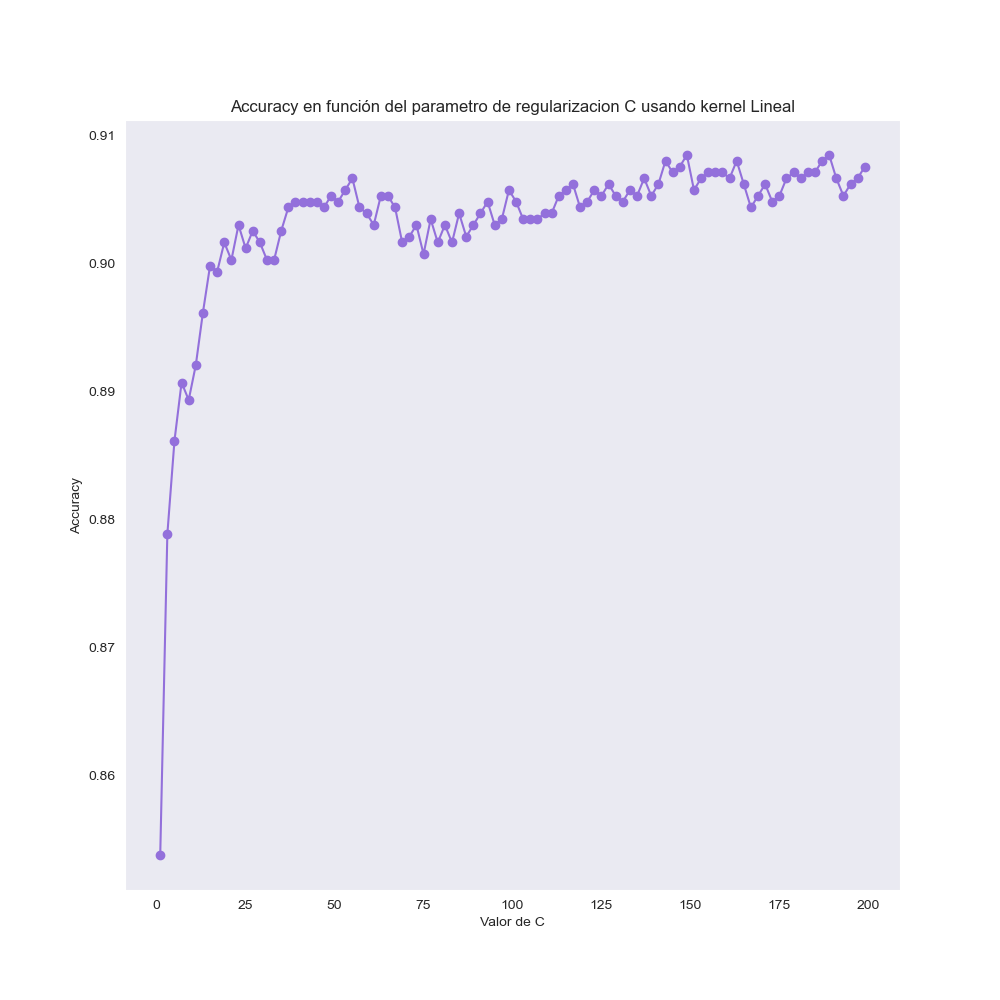

In [24]:
#instanciamos las listas del valor de regularizacion y el accuracy para poder graficarlas
accuracy, regulariz = accuracyVariandoC(X,Y,Xtest,Ytest,201,2)
#graficamos las listas recien creadas
plt.subplots(figsize=(10,10)) 
plt.plot(regulariz,accuracy, 'o-',color='mediumpurple')
plt.title('Accuracy en función del parametro de regularizacion C usando kernel Lineal')
plt.ylabel('Accuracy')
plt.xlabel('Valor de C')
plt.show()

## Consideramos el parametro optimo de C como 50 ya que observamos a partir de ese punto el accuracy score tiende a su asintota.

## Graficamos las curvas ROC usando clasificacion 1 vs el resto

<IPython.core.display.Javascript object>


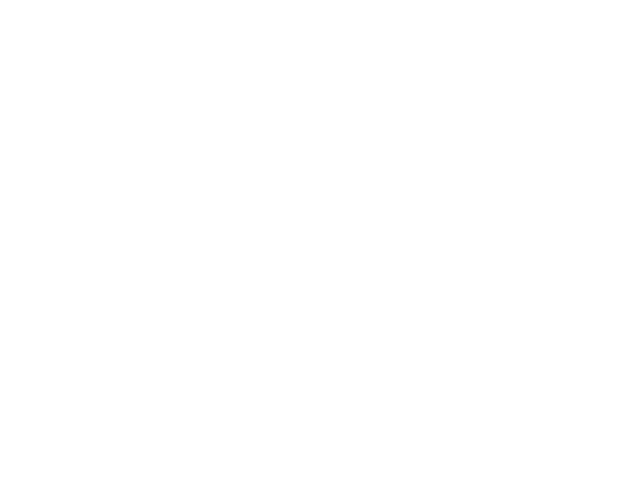

<IPython.core.display.Javascript object>


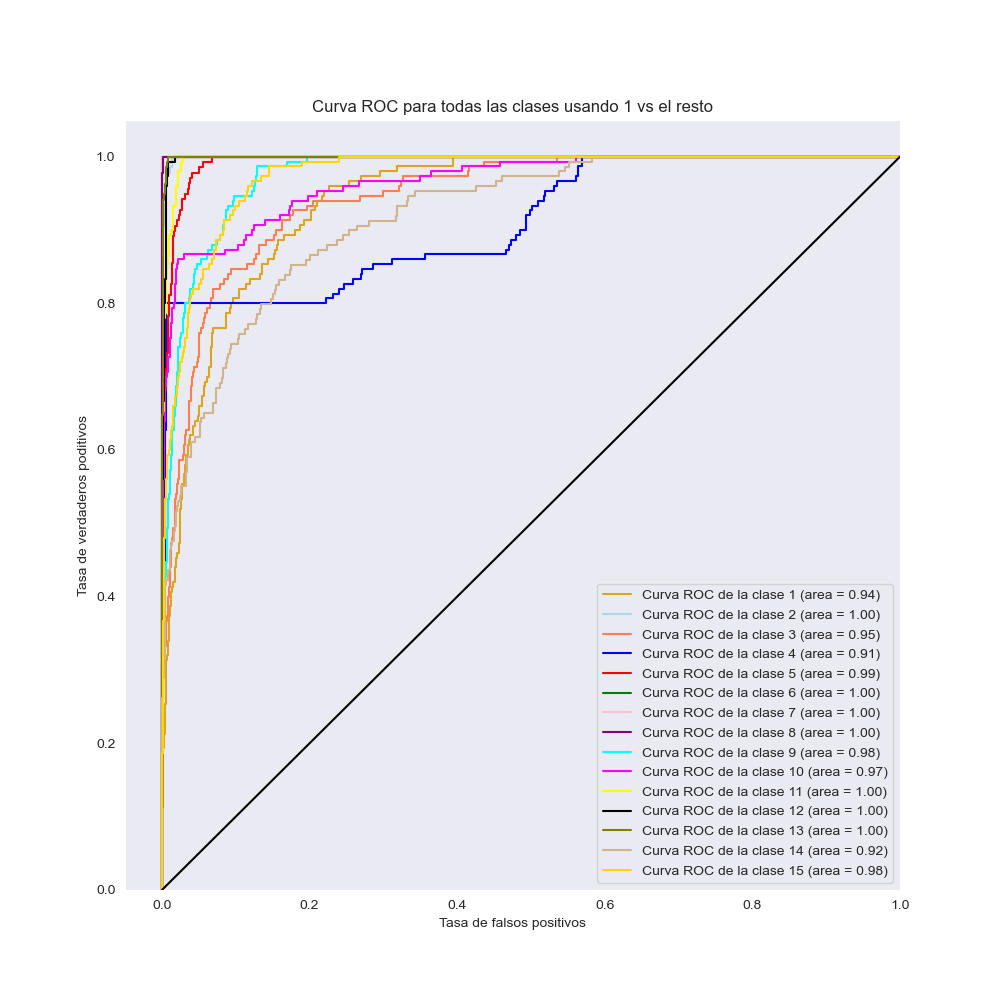

In [26]:
#para obtener las curvas ROc es necesario binarizar las Y's
from sklearn.preprocessing import label_binarize
#binarizamos las Y de entrenamiento
y_bintr = label_binarize(Y, classes=[0, 1, 2, 3, 4 ,5, 6, 7, 8, 9, 10, 11, 12, 13, 14])
#binarizamos las Y de test
y_bint = label_binarize(Ytest, classes=[0, 1, 2, 3, 4 ,5, 6, 7, 8, 9, 10, 11, 12, 13, 14])
#instanciamos un clasificador uno contra el resto usando la SVM
classifier = OneVsRestClassifier(SVC(kernel='linear', C=50))
#obtenemos el score de las predicciones
y_score = classifier.fit(X, y_bintr).decision_function(Xtest)
# graficamos las curvas roc segun su clase
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(15):
    fpr[i], tpr[i], _ = roc_curve(y_bint[:,i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['goldenrod', 'lightblue', 'coral','blue','red','green', 'pink', 'purple','cyan','magenta','yellow','black','olive', 'tan','gold'])
plt.figure()
fig = plt.subplots(figsize=(10, 10))
for i, color in zip(range(15), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=1.5, label='Curva ROC de la clase {0} (area = {1:0.2f})' ''.format(i+1, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k-', lw=1.5)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos poditivos')
plt.title('Curva ROC para todas las clases usando 1 vs el resto')
plt.legend(loc="lower right")
plt.show()

## Creamos la matriz de confusion y la mostramos 

<IPython.core.display.Javascript object>


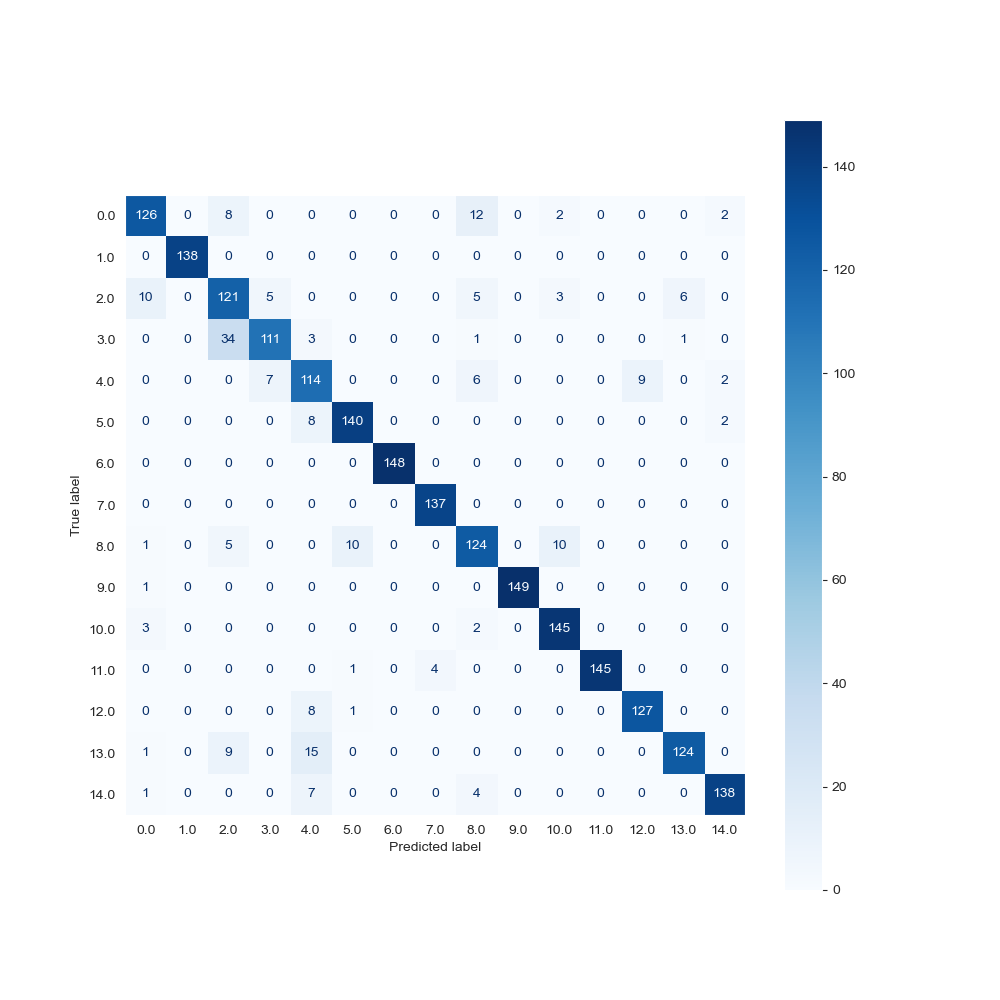

In [27]:
SVM = SVC(kernel='linear', C=50)
#hacemos un fit usando los datos X e Y
SVM.fit(X,Y)
#predecimos nuestros valores de Xtest
prediccion = SVM.predict(Xtest)
#creamos la matriz de confusion
confusion_matrix(Ytest, prediccion)
#graficamos la matriz de confusion usando la funcion de scikit learn y la mostramos
fig, ax = plt.subplots(figsize=(10, 10))
plot_confusion_matrix(SVM, Xtest, Ytest,cmap=plt.cm.Blues, ax=ax) 
plt.show()

## Mostramos el reporte de clasificacion

In [28]:
target_names = ['clase 0', 'clase 1', 'clase 2', 'clase 3','clase 4','clase 5','clase 6',
               'clase 7','clase 8','clase 9','clase 10','clase 11','clase 12','clase 13','clase 14']
print(classification_report(Ytest, prediccion, target_names=target_names))

              precision    recall  f1-score   support

     clase 0       0.88      0.84      0.86       150
     clase 1       1.00      1.00      1.00       138
     clase 2       0.68      0.81      0.74       150
     clase 3       0.90      0.74      0.81       150
     clase 4       0.74      0.83      0.78       138
     clase 5       0.92      0.93      0.93       150
     clase 6       1.00      1.00      1.00       148
     clase 7       0.97      1.00      0.99       137
     clase 8       0.81      0.83      0.82       150
     clase 9       1.00      0.99      1.00       150
    clase 10       0.91      0.97      0.94       150
    clase 11       1.00      0.97      0.98       150
    clase 12       0.93      0.93      0.93       136
    clase 13       0.95      0.83      0.89       149
    clase 14       0.96      0.92      0.94       150

    accuracy                           0.90      2196
   macro avg       0.91      0.91      0.91      2196
weighted avg       0.91   